In [1]:
import os

# List files in the dataset directory
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

/kaggle/input/personal-key-indicators-of-heart-disease/2020/heart_2020_cleaned.csv
/kaggle/input/personal-key-indicators-of-heart-disease/2022/heart_2022_with_nans.csv
/kaggle/input/personal-key-indicators-of-heart-disease/2022/heart_2022_no_nans.csv


In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

heart_2020_cleaned = pd.read_csv('/kaggle/input/personal-key-indicators-of-heart-disease/2020/heart_2020_cleaned.csv')
print('Head:\n', heart_2020_cleaned.head())
print('Shape:\n', heart_2020_cleaned.shape)
print('Info:\n', heart_2020_cleaned.info())
print('Null:\n', heart_2020_cleaned.isnull().sum())
print('Duplicated:\n', heart_2020_cleaned.duplicated().sum())
print('Describe:\n', heart_2020_cleaned.describe())

Head:
   HeartDisease    BMI Smoking AlcoholDrinking Stroke  PhysicalHealth  \
0           No  16.60     Yes              No     No             3.0   
1           No  20.34      No              No    Yes             0.0   
2           No  26.58     Yes              No     No            20.0   
3           No  24.21      No              No     No             0.0   
4           No  23.71      No              No     No            28.0   

   MentalHealth DiffWalking     Sex  AgeCategory   Race Diabetic  \
0          30.0          No  Female        55-59  White      Yes   
1           0.0          No  Female  80 or older  White       No   
2          30.0          No    Male        65-69  White      Yes   
3           0.0          No  Female        75-79  White       No   
4           0.0         Yes  Female        40-44  White       No   

  PhysicalActivity  GenHealth  SleepTime Asthma KidneyDisease SkinCancer  
0              Yes  Very good        5.0    Yes            No        Yes  
1

In [3]:
heart_2020_cleaned['Sex'].unique()

array(['Female', 'Male'], dtype=object)

In [4]:
heart_2020_cleaned['Diabetic'].unique()

array(['Yes', 'No', 'No, borderline diabetes', 'Yes (during pregnancy)'],
      dtype=object)

In [5]:
mapping = {
    'Male': 0,
    'Female': 1
}
heart_2020_cleaned['Sex'] = heart_2020_cleaned['Sex'].map(mapping)
heart_2020_cleaned.head()

mapping = {
    'No': 0,
    'Yes': 1
}
heart_2020_cleaned['HeartDisease'] = heart_2020_cleaned['HeartDisease'].map(mapping)
heart_2020_cleaned['Smoking'] = heart_2020_cleaned['Smoking'].map(mapping)
heart_2020_cleaned['AlcoholDrinking'] = heart_2020_cleaned['AlcoholDrinking'].map(mapping)
heart_2020_cleaned['Stroke'] = heart_2020_cleaned['Stroke'].map(mapping)
heart_2020_cleaned['DiffWalking'] = heart_2020_cleaned['DiffWalking'].map(mapping)
heart_2020_cleaned['PhysicalActivity'] = heart_2020_cleaned['PhysicalActivity'].map(mapping)
heart_2020_cleaned['Asthma'] = heart_2020_cleaned['Asthma'].map(mapping)
heart_2020_cleaned['KidneyDisease'] = heart_2020_cleaned['KidneyDisease'].map(mapping)
heart_2020_cleaned['SkinCancer'] = heart_2020_cleaned['SkinCancer'].map(mapping)
heart_2020_cleaned.head()

,HeartDisease,BMI,Smoking,AlcoholDrinking,Stroke,PhysicalHealth,MentalHealth,DiffWalking,Sex,AgeCategory,Race,Diabetic,PhysicalActivity,GenHealth,SleepTime,Asthma,KidneyDisease,SkinCancer
0,0,16.60,1,0,0,3.0,30.0,0,1,55-59,White,Yes,1,Very good,5.0,1,0,1
1,0,20.34,0,0,1,0.0,0.0,0,1,80 or older,White,No,1,Very good,7.0,0,0,0
2,0,26.58,1,0,0,20.0,30.0,0,0,65-69,White,Yes,1,Fair,8.0,1,0,0
3,0,24.21,0,0,0,0.0,0.0,0,1,75-79,White,No,0,Good,6.0,0,0,1
4,0,23.71,0,0,0,28.0,0.0,1,1,40-44,White,No,1,Very good,8.0,0,0,0


In [6]:
heart_2020_cleaned['GenHealth'].unique()

array(['Very good', 'Fair', 'Good', 'Poor', 'Excellent'], dtype=object)

In [7]:
mapping = {
    'Poor': 0,
    'Fair': 1,
    'Good': 2,
    'Very good': 3,
    'Excellent': 4
}

heart_2020_cleaned['GenHealth'] = heart_2020_cleaned['GenHealth'].map(mapping)
heart_2020_cleaned.head()

,HeartDisease,BMI,Smoking,AlcoholDrinking,Stroke,PhysicalHealth,MentalHealth,DiffWalking,Sex,AgeCategory,Race,Diabetic,PhysicalActivity,GenHealth,SleepTime,Asthma,KidneyDisease,SkinCancer
0,0,16.60,1,0,0,3.0,30.0,0,1,55-59,White,Yes,1,3,5.0,1,0,1
1,0,20.34,0,0,1,0.0,0.0,0,1,80 or older,White,No,1,3,7.0,0,0,0
2,0,26.58,1,0,0,20.0,30.0,0,0,65-69,White,Yes,1,1,8.0,1,0,0
3,0,24.21,0,0,0,0.0,0.0,0,1,75-79,White,No,0,2,6.0,0,0,1
4,0,23.71,0,0,0,28.0,0.0,1,1,40-44,White,No,1,3,8.0,0,0,0


In [8]:
heart_2020_cleaned['AgeCategory'].unique()

array(['55-59', '80 or older', '65-69', '75-79', '40-44', '70-74',
       '60-64', '50-54', '45-49', '18-24', '35-39', '30-34', '25-29'],
      dtype=object)

In [9]:
mapping = {
    '18-24': 0,
    '25-29': 1,
    '30-34': 2,
    '35-39': 3,
    '40-44': 4,
    '45-49': 5,
    '50-54': 6,
    '55-59': 7,
    '60-64': 8,
    '65-69': 9,
    '70-74': 10,
    '75-79': 11,
    '80 or older': 12
}

heart_2020_cleaned['AgeCategory'] = heart_2020_cleaned['AgeCategory'].map(mapping)
heart_2020_cleaned.head()

,HeartDisease,BMI,Smoking,AlcoholDrinking,Stroke,PhysicalHealth,MentalHealth,DiffWalking,Sex,AgeCategory,Race,Diabetic,PhysicalActivity,GenHealth,SleepTime,Asthma,KidneyDisease,SkinCancer
0,0,16.60,1,0,0,3.0,30.0,0,1,7,White,Yes,1,3,5.0,1,0,1
1,0,20.34,0,0,1,0.0,0.0,0,1,12,White,No,1,3,7.0,0,0,0
2,0,26.58,1,0,0,20.0,30.0,0,0,9,White,Yes,1,1,8.0,1,0,0
3,0,24.21,0,0,0,0.0,0.0,0,1,11,White,No,0,2,6.0,0,0,1
4,0,23.71,0,0,0,28.0,0.0,1,1,4,White,No,1,3,8.0,0,0,0


In [10]:
heart_2020_cleaned['Race'].unique()

array(['White', 'Black', 'Asian', 'American Indian/Alaskan Native',
       'Other', 'Hispanic'], dtype=object)

In [11]:
mapping = {
    'White': 0,
    'Black': 1,
    'Hispanic': 2,
    'Asian': 3,
    'American Indian/Alaskan Native': 4,
    'Other': 5
}

heart_2020_cleaned['Race'] = heart_2020_cleaned['Race'].map(mapping)
heart_2020_cleaned.head()

,HeartDisease,BMI,Smoking,AlcoholDrinking,Stroke,PhysicalHealth,MentalHealth,DiffWalking,Sex,AgeCategory,Race,Diabetic,PhysicalActivity,GenHealth,SleepTime,Asthma,KidneyDisease,SkinCancer
0,0,16.60,1,0,0,3.0,30.0,0,1,7,0,Yes,1,3,5.0,1,0,1
1,0,20.34,0,0,1,0.0,0.0,0,1,12,0,No,1,3,7.0,0,0,0
2,0,26.58,1,0,0,20.0,30.0,0,0,9,0,Yes,1,1,8.0,1,0,0
3,0,24.21,0,0,0,0.0,0.0,0,1,11,0,No,0,2,6.0,0,0,1
4,0,23.71,0,0,0,28.0,0.0,1,1,4,0,No,1,3,8.0,0,0,0


In [12]:
print('Null:\n', heart_2020_cleaned.isnull().sum())

Null:
 HeartDisease        0
BMI                 0
Smoking             0
AlcoholDrinking     0
Stroke              0
PhysicalHealth      0
MentalHealth        0
DiffWalking         0
Sex                 0
AgeCategory         0
Race                0
Diabetic            0
PhysicalActivity    0
GenHealth           0
SleepTime           0
Asthma              0
KidneyDisease       0
SkinCancer          0
dtype: int64


             Feature  Importance
0                BMI    0.354918
1            Smoking    0.022687
2    AlcoholDrinking    0.010247
3             Stroke    0.018980
4     PhysicalHealth    0.072995
5       MentalHealth    0.066436
6        DiffWalking    0.022389
7                Sex    0.016307
8        AgeCategory    0.091766
9               Race    0.034111
10          Diabetic    0.020698
11  PhysicalActivity    0.032026
12         GenHealth    0.072195
13         SleepTime    0.105612
14            Asthma    0.022497
15     KidneyDisease    0.012275
16        SkinCancer    0.023861


<Axes: xlabel='Feature'>

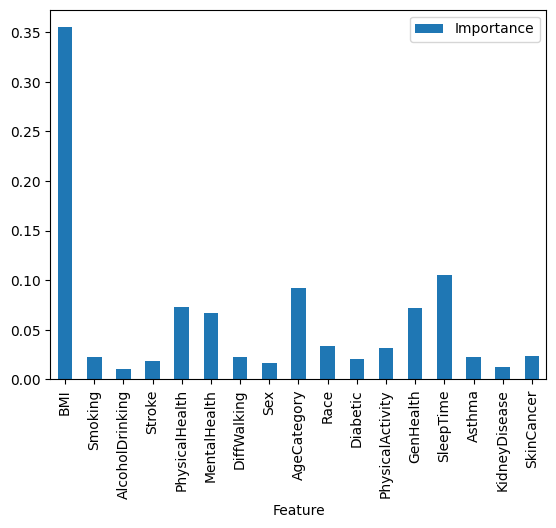

In [13]:
from sklearn import tree
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

X = heart_2020_cleaned.drop('HeartDisease', axis=1)
y = heart_2020_cleaned['HeartDisease']

categorical_cols = X.select_dtypes(include=['object']).columns

le = LabelEncoder()
y = le.fit_transform(y)
for col in categorical_cols:
    X[col] = le.fit_transform(X[col])

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

clf = tree.DecisionTreeClassifier()
clf = clf.fit(X_train, y_train)

features = X.columns
importances = clf.feature_importances_
feature_importances_df = pd.DataFrame({'Feature': features, 'Importance': importances})
feature_importances_df.sort_values(by='Importance', ascending=False)
print(feature_importances_df)
feature_importances_df.plot(kind='bar', x='Feature', y='Importance')

In [14]:
from sklearn.ensemble import AdaBoostClassifier, BaggingClassifier, RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.dummy import DummyClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression, LogisticRegressionCV, Perceptron, SGDClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split

In [15]:
models = {
#     'AdaBoostClassifier': AdaBoostClassifier(),
#     'BaggingClassifier': BaggingClassifier(),
    'DecisionTreeClassifier': DecisionTreeClassifier(),
#     'DummyClassifier': DummyClassifier(),
    'KNeighborsClassifier': KNeighborsClassifier(),
#     'LogisticRegression': LogisticRegression(),
#     'LogisticRegressionCV': LogisticRegressionCV(),
    'MLPClassifier': MLPClassifier(),
    'Perceptron': Perceptron(),
    'RandomForestClassifier': RandomForestClassifier(),
#     'SGDClassifier': SGDClassifier(),
    'SVC': SVC()
}

In [16]:
# Fit and evaluate models
results = {}
for name, model in models.items():
    model.fit(X_train, y_train)
    accuracy = model.score(X_test, y_test)
    results[name] = accuracy

# Convert results to DataFrame
results_df = pd.DataFrame(list(results.items()), columns=['Model', 'Accuracy'])
print(results_df)

                    Model  Accuracy
0  DecisionTreeClassifier  0.863241
1    KNeighborsClassifier  0.905424
2           MLPClassifier  0.913523
3              Perceptron  0.913116
4  RandomForestClassifier  0.904064
5                     SVC  0.912569


In [17]:
from mlxtend.frequent_patterns import apriori, association_rules

# Prepare the data for association rule mining
thresholds = X.mean()
binarized_data = (X > thresholds).astype(int)

# Perform Apriori algorithm
frequent_itemsets = apriori(binarized_data, min_support=0.1, use_colnames=True)

# Generate association rules
rules = association_rules(frequent_itemsets, metric="confidence", min_threshold=0.6)

# Sort rules by confidence
rules = rules.sort_values(by='confidence', ascending=False)

print(rules)

/opt/conda/lib/python3.10/site-packages/mlxtend/frequent_patterns/fpcommon.py:109: DeprecationWarning: DataFrames with non-bool types result in worse computationalperformance and their support might be discontinued in the future.Please use a DataFrame with bool type
  warnings.warn(


                            antecedents         consequents  \
15                          (GenHealth)  (PhysicalActivity)   
33                     (Sex, GenHealth)  (PhysicalActivity)   
38               (SleepTime, GenHealth)  (PhysicalActivity)   
35             (AgeCategory, GenHealth)  (PhysicalActivity)   
41          (Sex, SleepTime, GenHealth)  (PhysicalActivity)   
39        (Sex, AgeCategory, GenHealth)  (PhysicalActivity)   
42  (AgeCategory, SleepTime, GenHealth)  (PhysicalActivity)   
26                 (Smoking, GenHealth)  (PhysicalActivity)   
20                     (BMI, GenHealth)  (PhysicalActivity)   
7                         (DiffWalking)       (AgeCategory)   
16                          (SleepTime)  (PhysicalActivity)   
9                            (Diabetic)       (AgeCategory)   
8                                 (Sex)  (PhysicalActivity)   
34                     (Sex, SleepTime)  (PhysicalActivity)   
10                        (AgeCategory)  (PhysicalActiv

In [18]:
# Filter rules based on lift and confidence
filtered_rules = rules[(rules['lift'] > 1.2) & (rules['confidence'] > 0.7)]

# Merge with feature importances to see which important features are involved in rules
rules_with_importance = filtered_rules.copy()
rules_with_importance['antecedents'] = rules_with_importance['antecedents'].apply(lambda x: ', '.join(list(x)))
rules_with_importance['consequents'] = rules_with_importance['consequents'].apply(lambda x: ', '.join(list(x)))

# Merge with feature importance DataFrame
rules_with_importance = rules_with_importance.merge(feature_importances_df, left_on='antecedents', right_on='Feature', how='left')

print(rules_with_importance[['antecedents', 'consequents', 'support', 'confidence', 'lift', 'Importance']])

   antecedents  consequents   support  confidence      lift  Importance
0  DiffWalking  AgeCategory  0.112034    0.806755  1.480236    0.022389
1     Diabetic  AgeCategory  0.119333    0.761079  1.396429    0.020698


In [19]:
from sklearn.tree import _tree

def get_rules(tree, feature_names, class_names):
    tree_ = tree.tree_
    feature_name = [
        feature_names[i] if i != _tree.TREE_UNDEFINED else "undefined!"
        for i in tree_.feature
    ]
    
    paths = []
    
    def recurse(node, path, paths):
        if tree_.feature[node] != _tree.TREE_UNDEFINED:
            name = feature_name[node]
            threshold = tree_.threshold[node]
            path.append(f"({name} <= {threshold})")
            recurse(tree_.children_left[node], path, paths)
            path.pop()
            path.append(f"({name} > {threshold})")
            recurse(tree_.children_right[node], path, paths)
            path.pop()
        else:
            path.append(f"then class: {class_names[tree_.value[node].argmax()]} (proba: {tree_.value[node].max() / tree_.value[node].sum() * 100:.2f}%) based on {tree_.n_node_samples[node]} samples")
            paths.append(path[:])
            path.pop()
    
    recurse(0, [], paths)
    
    rules = [" and ".join(path) for path in paths]
    return rules

# Get the rules
rules = get_rules(clf, X.columns, le.classes_)
for rule in rules:
    print(rule)

(GenHealth <= 1.5) and (AgeCategory <= 6.5) and (Stroke <= 0.5) and (AgeCategory <= 3.5) and (SleepTime <= 4.5) and (GenHealth <= 0.5) and (Race <= 3.5) and (PhysicalHealth <= 4.0) and then class: No (proba: 100.00%) based on 12 samples
(GenHealth <= 1.5) and (AgeCategory <= 6.5) and (Stroke <= 0.5) and (AgeCategory <= 3.5) and (SleepTime <= 4.5) and (GenHealth <= 0.5) and (Race <= 3.5) and (PhysicalHealth > 4.0) and (Sex <= 0.5) and (BMI <= 41.35000038146973) and (PhysicalActivity <= 0.5) and (BMI <= 21.875) and (Diabetic <= 1.0) and then class: No, borderline diabetes (proba: 100.00%) based on 2 samples
(GenHealth <= 1.5) and (AgeCategory <= 6.5) and (Stroke <= 0.5) and (AgeCategory <= 3.5) and (SleepTime <= 4.5) and (GenHealth <= 0.5) and (Race <= 3.5) and (PhysicalHealth > 4.0) and (Sex <= 0.5) and (BMI <= 41.35000038146973) and (PhysicalActivity <= 0.5) and (BMI <= 21.875) and (Diabetic > 1.0) and then class: No (proba: 100.00%) based on 1 samples
(GenHealth <= 1.5) and (AgeCatego